<center>

# **Analiza mreža**
## **Helsinki City Bikes: Network Analysis**

### **2022./2023.**
## **Grgur Živković**
</center>

Based on: https://www.kaggle.com/code/geometrein/helsinki-city-bike-network-analysis

**INTRODUCTION:**
Helsinki City Bikes are shared bicycles available to the public in Helsinki and Espoo metropolitan areas. The main aim of the Helsinki city bike system is to address the so-called last-mile problem present in all distribution networks. The city bikes were introduced in 2016 anf after becoming popular among the citizens, Helsinki city decided to gradually expand the bike network. As of 2020, there were 3,510 bikes and 350 stations operating in Helsinki and Espoo.

In order to use the city bikes, citizens purchase access for a day, week or the entire cycling season that lasts from April to November. All passes include an unlimited number of 30-minute bike rides. For an extra fee of 1€/hour, you can use the bike for longer. Bikes are picked up and returned to stations that are located all around Helsinki and Espoo.

**DATASET SOURCE:** https://www.kaggle.com/datasets/geometrein/helsinki-city-bikes

**DATASET DESCRIPTION:**
The dataset provides information about a series of departures and returns, including their respective timestamps, locations, identifiers, distances, durations, average speeds, and air temperatures. Each row in the dataset represents a specific departure and return instance.

The columns in the dataset are described as follows:

- Departure: The timestamp indicating the departure date and time in the format MM/DD/YYYY HH:MM.
- Return: The timestamp indicating the return date and time in the format MM/DD/YYYY HH:MM.
- Departure_id: The unique identifier for the departure location.
- Departure_name: The name or description of the departure location.
- Return_id: The unique identifier for the return location.
- Return_name: The name or description of the return location.
- Distance (m): The distance between the departure and return locations in meters.
- Duration (sec.): The duration of the trip in seconds.
- Avg_speed (km/h): The average speed of the trip in kilometers per hour.
- Departure_latitude: The latitude coordinate of the departure location.
- Departure_longitude: The longitude coordinate of the departure location.
- Return_latitude: The latitude coordinate of the return location.
- Return_longitude: The longitude coordinate of the return location.
- Air temperature (degC): The air temperature in degrees Celsius during the departure and return.

**INTENTION**: Analyzing Transportation Networks and Travel Patterns

**Hypothesis:** \\
 1. There is a relationship between the duration, traveled distance, and the number of riders in the bike network.

 2. Certain departure and return locations act as transportation hubs, exhibiting a higher frequency of trips and serving as central points for travel within the network.

 3. Air temperature has an impact on travel patterns, with a higher frequency of trips observed during more favorable weather conditions.

 4. There are communities or clusters of bike stations within the network.

# **1. EDA**

In [ ]:
import datetime
import calendar
import collections

import numpy as np
import pandas as pd

import matplotlib.cm as cm
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap, LinearSegmentedColormap

import seaborn as sns
import plotly.graph_objects as go

import networkx as nx
!pip install python-louvain==0.13
import community as community_louvain
from operator import itemgetter

import folium
from folium import plugins

# Custom Colors
MAGENTA = "#6C3483"
GREEN = "#239B56"
BLUE = "#5DADE2"

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Preparing metadata (setup.py) ... done
  Created wheel for python-louvain: filename=python_louvain-0.13-py3-none-any.whl size=9214 sha256=6c2fa45c9fc789357b9d0ae189083742173a8d489095d37e9adc69f39e59e09e
  Stored in directory: /root/.cache/pip/wheels/c1/30/0a/57d40abddcf654a3aafe5cd12204080d4f834116f198ab4f0e
Successfully built python-louvain
  Attempting uninstall: python-louvain
    Found existing installation: python-louvain 0.16
    Uninstalling python-louvain-0.16:
      Successfully uninstalled python-louvain-0.16


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
dataframe = pd.read_csv("/content/drive/MyDrive/Analiza_Mreza/HelsinkiBikes.csv", low_memory=False)
dataframe.head()

,departure,return,departure_id,departure_name,return_id,return_name,distance (m),duration (sec.),avg_speed (km/h),departure_latitude,departure_longitude,return_latitude,return_longitude,Air temperature (degC)
0,2020-03-23 06:09:44,2020-03-23 06:16:26,86,Kuusitie,111.0,Esterinportti,1747.0,401.0,0.261397,60.195245,24.901900,60.197572,24.926781,0.9
1,2020-03-23 06:11:58,2020-03-23 06:26:31,26,Kamppi (M),10.0,Kasarmitori,1447.0,869.0,0.099908,60.168610,24.930537,60.165017,24.949473,0.9
2,2020-03-23 06:16:29,2020-03-23 06:24:23,268,Porolahden koulu,254.0,Agnetankuja,1772.0,469.0,0.226695,60.195540,25.053581,60.187234,25.036412,0.9
3,2020-03-23 06:33:53,2020-03-23 07:14:03,751,Vallipolku,106.0,Korppaanmäentie,7456.0,2406.0,0.185935,60.227827,24.819614,60.203474,24.898930,0.9
4,2020-03-23 06:36:09,2020-03-23 07:04:10,62,Länsisatamankatu,121.0,Vilhonvuorenkatu,7120.0,1679.0,0.254437,60.158928,24.909692,60.186463,24.967872,0.9


In [ ]:
dataframe[['departure','return']] =  dataframe[['departure','return']].apply(pd.to_datetime, format='%Y-%m-%d %H:%M:%S.%f')

dataframe = dataframe.rename(columns={'distance (m)': 'distance',
                                     'duration (sec.)': 'duration',
                                     'avg_speed (km/h)':'speed',
                                      'Air temperature (degC)':'temperature',
                                     })
pd.set_option('display.float_format', lambda x: '%.3f' % x)
dataframe[["distance", "duration", "temperature"]].describe()

,distance,duration,temperature
count,12157458.000,12157458.000,12141556.000
mean,2295.275,959.775,15.650
std,24520.672,7346.528,5.498
min,-4292467.000,0.000,-5.200
25%,1000.000,344.000,12.300
50%,1739.000,586.000,16.400
75%,2869.000,971.000,19.300
max,3681399.000,5401659.000,32.900


In [ ]:
dataframe = dataframe[
                    (50 < dataframe['distance']) & (dataframe['distance'] < 10000) &
                    (120 < dataframe['duration']) & (dataframe['duration'] <  18000) & # after 5 hours, 80 euro penalty
                    (-20 < dataframe['temperature']) & (dataframe['temperature'] < 50)
                    ]

In [ ]:
dataframe.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 11278850 entries, 0 to 12157457
Data columns (total 14 columns):
 #   Column               Dtype         
---  ------               -----         
 0   departure            datetime64[ns]
 1   return               datetime64[ns]
 2   departure_id         object        
 3   departure_name       object        
 4   return_id            object        
 5   return_name          object        
 6   distance             float64       
 7   duration             float64       
 8   speed                float64       
 9   departure_latitude   float64       
 10  departure_longitude  float64       
 11  return_latitude      float64       
 12  return_longitude     float64       
 13  temperature          float64       
dtypes: datetime64[ns](2), float64(8), object(4)
memory usage: 1.3+ GB


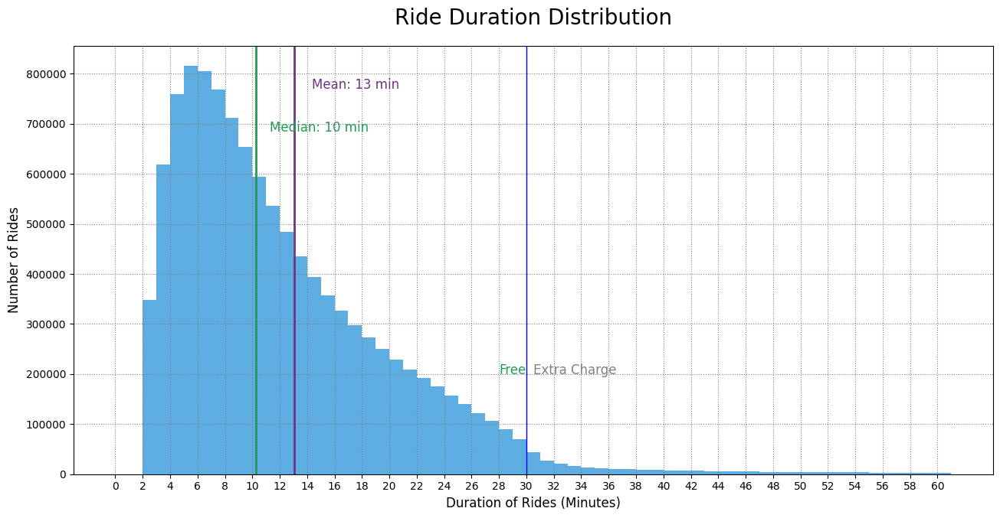

In [ ]:
def duration(dataframe):
    """
    """
    df = dataframe.copy()

    # Converting seconds to minutes
    df["duration"] = df["duration"]/60

    # Filtering relevant data
    duration_data = df["duration"]
    fig = plt.figure(figsize=(15,7))
    ax = fig.add_axes([0.1, 0.1, 0.8, 0.8])

    # Ploting the histogram
    plt.hist(duration_data, bins = range(62), color = BLUE, histtype ="bar")

    # Adding median and mean lines
    plt.axvline(df["duration"].mean(), color=MAGENTA, linestyle='-', linewidth=2 )
    plt.axvline(df["duration"].median(), color=GREEN, linestyle='-', linewidth=2 )
    plt.axvline(x = 30, color="blue", linestyle='-', linewidth=1 )

    # Adding median and mean texts
    min_ylim, max_ylim = plt.ylim()
    plt.text(df["duration"].mean()*1.1, max_ylim*0.9, 'Mean: {:.0f} min'.format(df["duration"].mean()), color = MAGENTA,  fontsize= 12)
    plt.text(df["duration"].median()*1.1, max_ylim*0.8, 'Median: {:.0f} min'.format(df["duration"].median()), color = GREEN, fontsize= 12)
    plt.text(x= 28,y=200000, s="Free", color = GREEN, fontsize= 12)
    plt.text(x= 30.5,y=200000, s="Extra Charge", color = "grey", fontsize= 12)

    # Seting ticks on x axis
    ticks =range(0, 62, 2)
    plt.xticks(ticks)
    # Seting ticks on y axis
    ticks =range(0, 3600, 2000)

    # Labeling Axes
    ax.set_title('Ride Duration Distribution', fontdict={"fontsize":20}, pad = 20)
    plt.xlabel("Duration of Rides (Minutes)", fontsize= 12, x = 0.5)
    plt.ylabel("Number of Rides", fontsize= 12)

    # Adding Grid
    plt.grid(linestyle=":", color='grey')

    plt.show()

duration(dataframe)

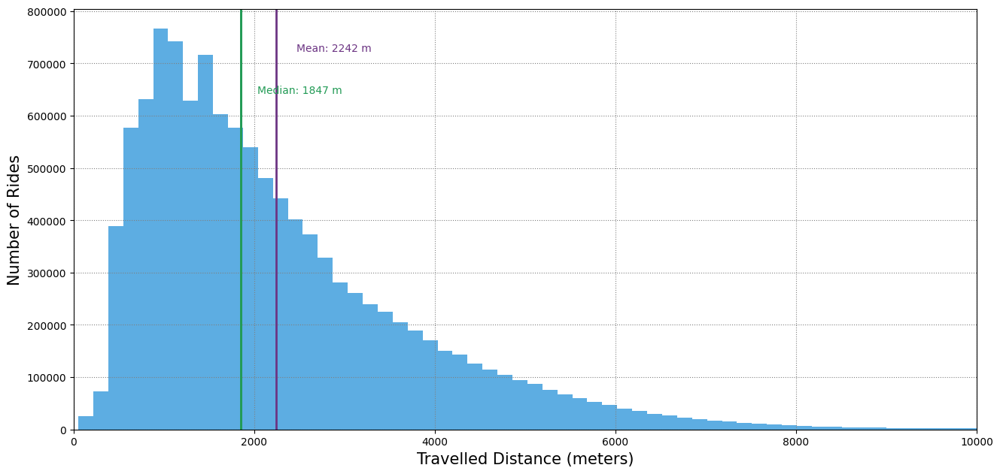

In [ ]:
def distance(dataframe):
    """
    """
    df = dataframe.copy()

    fig = plt.figure(figsize=(15,7))
    ax = fig.add_axes([0.1, 0.1, 0.8, 0.8])

    data = df["distance"]
    plt.hist(data, bins = 60, color = BLUE)


    plt.axvline(df["distance"].mean(), color=MAGENTA, linestyle='-', linewidth=2 )
    plt.axvline(df["distance"].median(), color=GREEN, linestyle='-', linewidth=2 )
    plt.axvline(df["distance"].median(), color=GREEN, linestyle='-', linewidth=2 )

    min_ylim, max_ylim = plt.ylim()

    plt.text(df["distance"].mean()*1.1, max_ylim*0.9, 'Mean: {:.0f} m'.format(df["distance"].mean()), color = MAGENTA,  fontsize= 10)
    plt.text(df["distance"].median()*1.1, max_ylim*0.8, 'Median: {:.0f} m'.format(df["distance"].median()), color = GREEN, fontsize= 10)

    ax.set_xlim([0,10000])

    # Labeling Axes
    plt.xlabel("Travelled Distance (meters)", fontsize= 15, x = 0.5)
    plt.ylabel("Number of Rides", fontsize= 15)

    # Adding Grid
    plt.grid(linestyle=":", color='grey')

    plt.show()

distance(dataframe)

 As we can see from the graphs above the individual trips through 5 years average around 13 minutes for a ride. Given the right-skewed distribution of the data, the averages are slightly skewed and the majority of trips actually last from 4–8 minutes and cover a distance of 1700 meters (approx.1 mile). The vast majority of rides are shorter than 30 minutes. However, 3.176% of users ended up exceeding the limit. Those that exceeded the 30-minute limit but not the 60-minutes limit collectively paid is €261.715 since the launch of the city bikes in 2016.

**Hypothesis 1: There is a relationship between the duration, traveled distance, and the number of riders in the bike network.** \\
**HA:** There is a significant relationship between the duration, traveled distance, and the number of riders in the bike network.

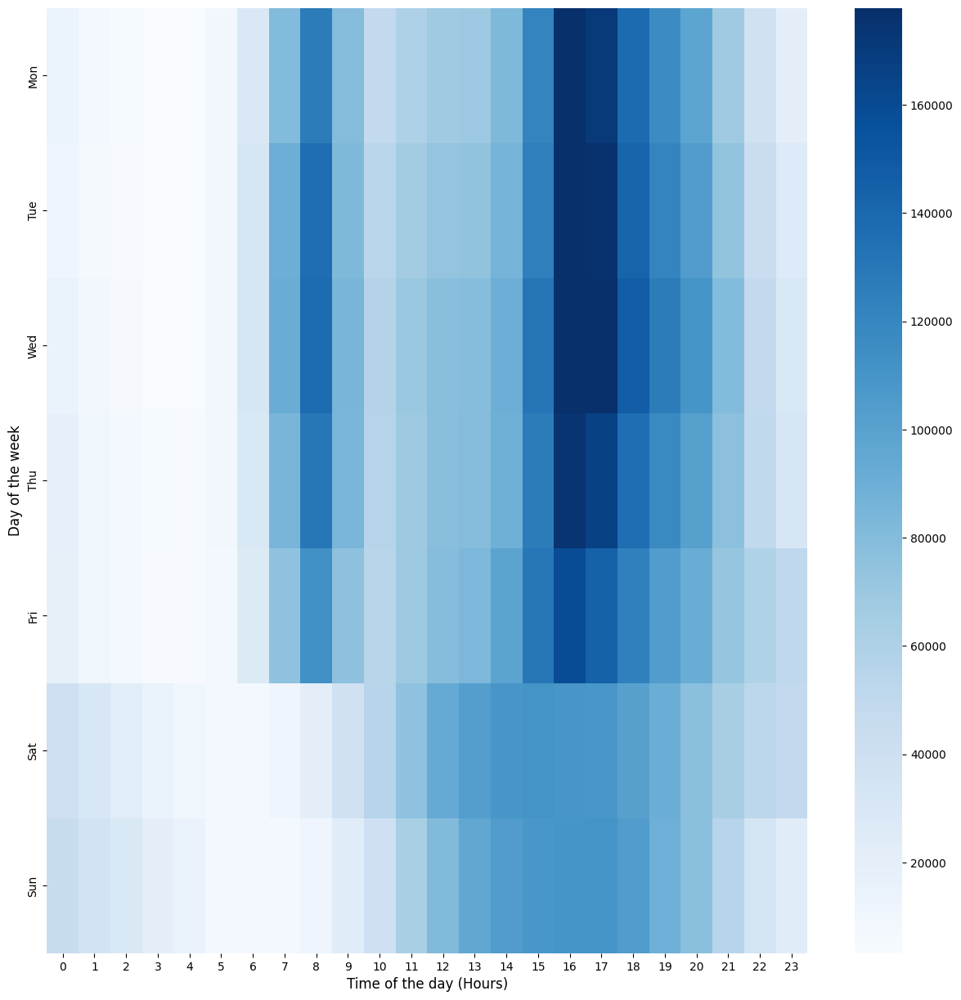

In [ ]:
def weekday_heatmap(dataframe):
    """
    """
    weekdays = ["Mon", "Tue","Wed", "Thu", "Fri", "Sat", "Sun"]

    # Data
    df = dataframe.copy()
    df["hour"] = pd.DatetimeIndex(df['departure']).hour
    df["weekday"] = pd.DatetimeIndex(df['departure']).weekday
    daily_activity = df.groupby(by=['weekday','hour']).count()['departure_name'].unstack()

    # Figure
    fig, ax = plt.subplots(figsize=(15,15))
    sns.heatmap(daily_activity, robust=True, cmap="Blues", yticklabels=weekdays) # "YlOrBr

    # Labeling Axes
    plt.xlabel("Time of the day (Hours)", fontsize= 12, x = 0.5)
    plt.ylabel("Day of the week", fontsize= 12)

weekday_heatmap(dataframe)

If we look at the heatmap above we can see a clear usage pattern. The Most intensive bike usage occurs from 6:00 to 8:00  and from 16:00 to 18:00 on weekdays. This shows that bikes are actively used by commuters around the beginning and the end of the working day.

On weekends, however, the usage is different. Seems like Helsinkis' citizens prefer to kick off the weekend a little late. The most active hours are between 15:00 and 17:00. Interestingly enough the usage of city bikes is higher around midnight on weekend. This could mean that on weekends city bikes are used as a substitute when the other forms of public transport are no longer available.

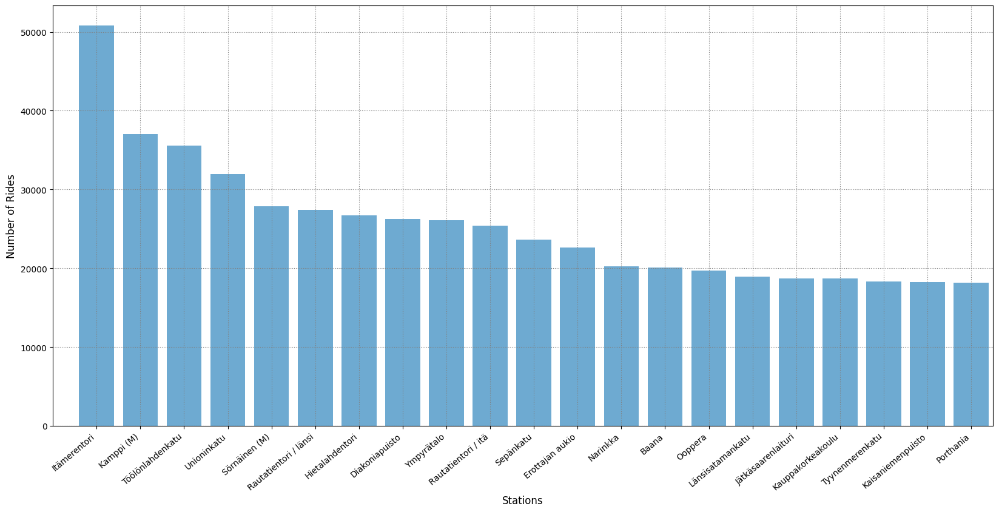

In [ ]:
def topDepartureStantions(dataframe):
    """
    This function displays top stations by departure
    """
    # Data
    df = dataframe.copy()
    df = df[df['departure'].dt.year == 2017]

    # Figure
    fig = plt.figure(figsize=(20,9))
    ax = sns.countplot(x="departure_name", color = BLUE, data=df, order = df['departure_name'].value_counts().index)

    # Labeling Axes
    ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right")
    plt.xlabel("Stations", fontsize= 12, x = 0.5)
    plt.ylabel("Number of Rides", fontsize= 12)
    plt.xlim(-1,20.5)

    # Adding Grid
    plt.grid(linestyle=":", color='grey')

topDepartureStantions(dataframe)

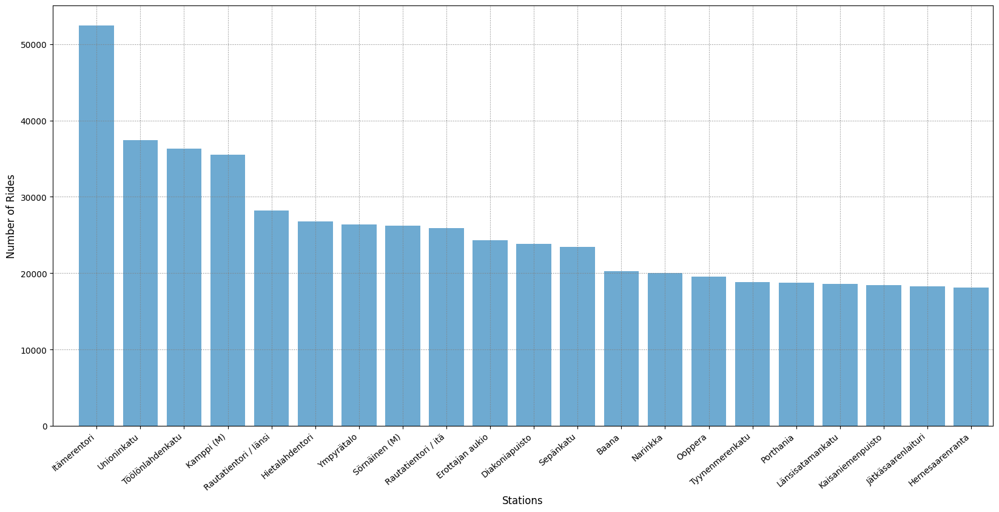

In [ ]:
def topReturnStantions(dataframe):
    """
    This function displays top stations by return
    """
    # Data
    df = dataframe.copy()
    df = df[df['departure'].dt.year == 2017]

    # Figure
    fig = plt.figure(figsize=(20,9))
    ax = sns.countplot(x="return_name", color = BLUE, data=df, order = df['return_name'].value_counts().index)

    # Labeling Axes
    ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right")
    plt.xlabel("Stations", fontsize= 12, x = 0.5)
    plt.ylabel("Number of Rides", fontsize= 12)
    plt.xlim(-1,20.5)

    # Adding Grid
    plt.grid(linestyle=":", color='grey')

topReturnStantions(dataframe)

As one can expect not all stations are used equally. In 2016 the station next to the Kamppi metro station(Central Helsinki) was the most popular one. However, since 2017 Itämerentori has become the undisputed champion by usage. Seeing Itämerentori and Töölönlahdenkatu as the most popular stations might be surprising, however, this popularity is explained by their location within the city bike network. While these stations are not in the centre of Helsinki they are grouped around the centre of the bike network. In 2016, when there were less than 50 stations, Kamppi was at the structural centre of the network. However, with the expansion of the network towards northern Helsinki the centre of the bike network moved north too. Because of this Itämerentori and Töölönlahdenkatu stations gained more "important" role within the whole network.

One boundary condition that can affect this list is bike availability in a given station. If there are no bikes available, then the dataset will not reflect the demand for bikes but rather their availability. What makes Itämerentori and Töölönlahdenkatu stations lively is that they are popular stations for both departures and returns. This ensures bike availability at all times and increases station usage.

# **2. Creating the Graph object**

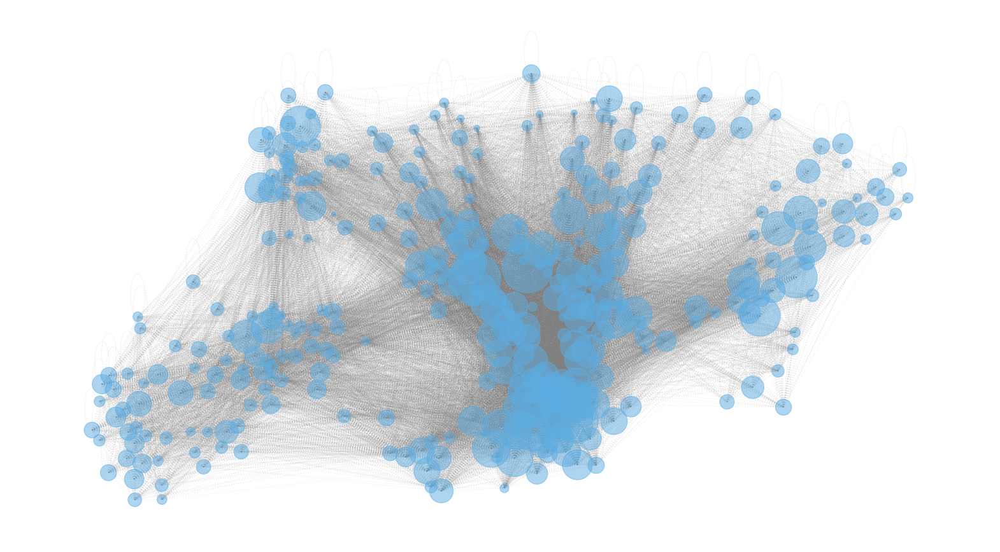

In [ ]:
def bikeNetwork(dataframe, year=2020):
    """
    This function plots the City bike network with node sizes illustrating station popularity.
    """
    # Data
    df = dataframe.copy()
    df = df[df['departure'].dt.year == year]
    df.dropna(inplace=True)

    # Graph
    G = nx.Graph()
    G = nx.from_pandas_edgelist(df, 'departure_name', 'return_name', edge_attr=['duration', 'distance'])

    # Positions
    stations = pd.read_csv("/content/drive/MyDrive/Analiza_Mreza/station_coordinates.csv")
    stations.set_index('name', inplace=True)
    stations["pos"] = list(zip(stations["longitude"].astype(float), stations["latitude"].astype(float)))
    pos = stations.to_dict()['pos']

    # Map "pos" attribute to nodes from pos dict
    for node, position in pos.items():
        try:
            G.nodes[node]['pos'] = position
        except KeyError:
            pass

    # Draw
    fig, ax = plt.subplots(figsize=(20,11))
    nx.draw_networkx_nodes(G=G, pos=G.nodes.data('pos'), node_color=BLUE, alpha=0.5,
                           node_size=(df['departure_name'].value_counts() / 15).tolist())
    nx.draw_networkx_edges(G=G, pos=G.nodes.data('pos'), edge_color='grey', style="dotted", alpha=0.1, arrows=False)
    ax.axis('off')
    # Export graph data as CSV
    node_attributes = nx.get_node_attributes(G, 'pos')
    edge_attributes = {
        'source': [],
        'target': [],
        'duration': [],
        'distance': []
    }

    # Extract edge attributes with source and target information
    for source, target, attr in G.edges(data=True):
        edge_attributes['source'].append(source)
        edge_attributes['target'].append(target)
        edge_attributes['duration'].append(attr['duration'])
        edge_attributes['distance'].append(attr['distance'])

    # Save node attributes as CSV
    node_data = {'node': list(node_attributes.keys()), 'pos': list(node_attributes.values())}
    df_nodes = pd.DataFrame(node_data)
    df_nodes.to_csv('node_attributes.csv', index=False)

    # Save edge attributes as CSV
    df_edges = pd.DataFrame(edge_attributes)
    df_edges.to_csv('edge_attributes.csv', index=False)

    return G

G = bikeNetwork(dataframe)


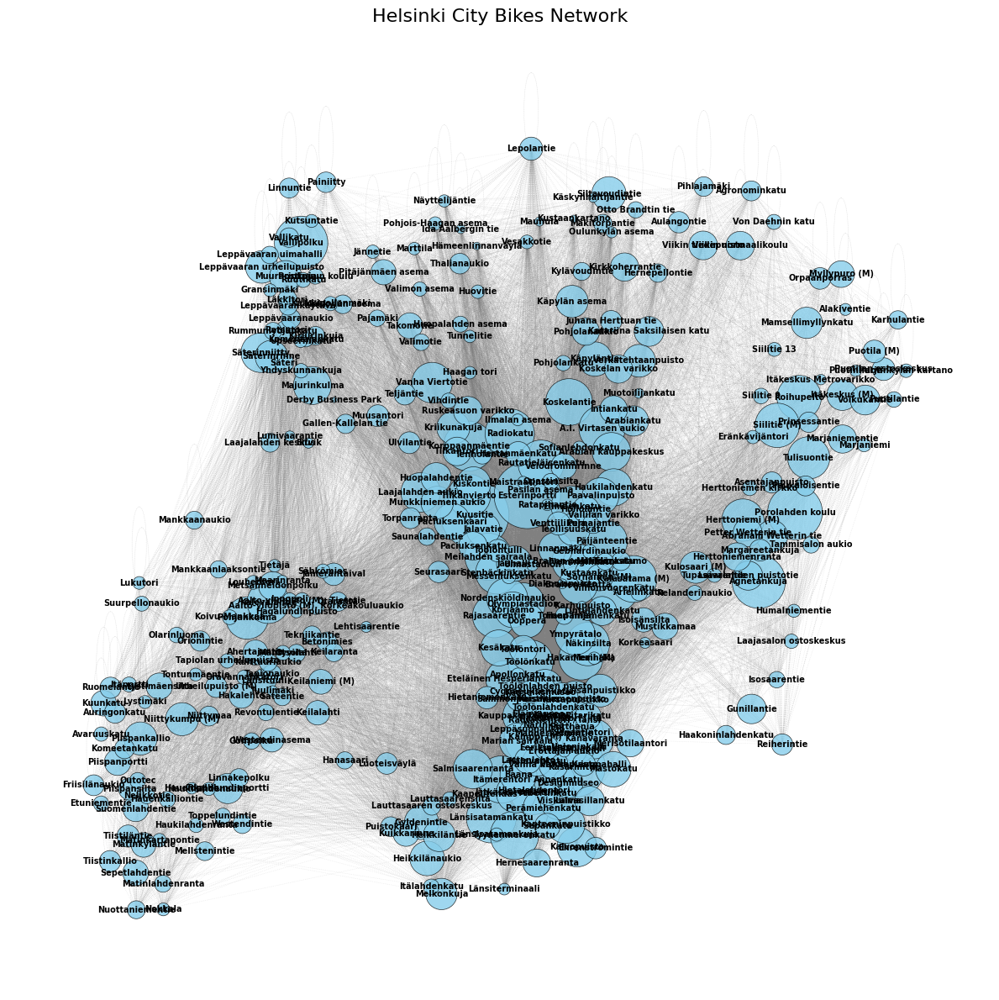

In [ ]:
def bikeNetwork(dataframe, year=2020):
    """
    This function plots the City bike network with node sizes illustrating station popularity.
    """
    # Data
    df = dataframe.copy()
    df = df[df['departure'].dt.year == year]
    df.dropna(inplace=True)
    #print(df.isna().sum())

    # Graphs
    G = nx.Graph()
    G = nx.from_pandas_edgelist(df, 'departure_name', 'return_name', edge_attr=['duration','distance'])

    # Positions
    stations  = pd.read_csv("/content/drive/MyDrive/Analiza_Mreza/station_coordinates.csv")
    stations.set_index('name',inplace=True)
    stations["pos"] = list(zip(stations["longitude"].astype(float), stations["latitude"].astype(float)))
    pos = stations.to_dict()['pos']

    # Map "pos" atribute to nodes from pos dict
    for node, position in pos.items():
        try:
            G.nodes[node]['pos'] = position
        except KeyError:
            pass

    node_sizes = (df['departure_name'].value_counts() / 15).tolist()

  # Create the figure and axes
    fig, ax = plt.subplots(figsize=(12, 12))

  # Draw nodes
    node_color = 'skyblue'
    node_alpha = 0.8
    node_edgecolor = 'k'
    node_linewidth = 0.5
    nx.draw_networkx_nodes(
      G=G,
      pos=pos,
      node_color=node_color,
      alpha=node_alpha,
      node_size=node_sizes,
      edgecolors=node_edgecolor,
      linewidths=node_linewidth
      )

# Draw edges
    edge_color = 'gray'
    edge_alpha = 0.2
    edge_style = 'dotted'
    edge_width = 0.5
    nx.draw_networkx_edges(
      G=G,
      pos=pos,
      edge_color=edge_color,
      alpha=edge_alpha,
      style=edge_style,
      width=edge_width
    )

# Draw node labels
    node_label_color = 'black'
    node_label_fontsize = 7
    node_label_fontweight = 'bold'
    nx.draw_networkx_labels(
      G=G,
      pos=pos,
      labels={node: node for node in G.nodes},
      font_color=node_label_color,
      font_size=node_label_fontsize,
      font_weight=node_label_fontweight
    )

# Set axis properties
    ax.set_title("Helsinki City Bikes Network", fontsize=16)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    ax.spines['left'].set_visible(False)

# Display the plot
    plt.tight_layout()
    plt.show()
    return G

G = bikeNetwork(dataframe)

**Hypothesis 2: Certain departure and return locations act as transportation hubs, exhibiting a higher frequency of trips and serving as central points for travel within the network.** \\
**HA:**There are variations in the popularity of bike stations in the network.


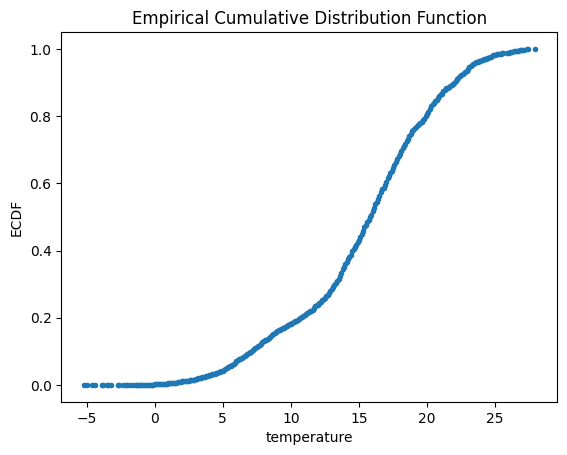

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import statsmodels.api as sm

def plot_ecdf(data, x):
    """
    Function to generate ECDF plots using statsmodels.
    """
    ecdf = sm.distributions.ECDF(data[x])
    x_values = sorted(set(data[x]))
    y_values = ecdf(x_values)

    plt.plot(x_values, y_values, marker='.', linestyle='none')
    plt.xlabel(x)
    plt.ylabel('ECDF')
    plt.title('Empirical Cumulative Distribution Function')
    plt.show()

# Load dataset and specify relevant columns
data = dataframe
data['departure'] = pd.to_datetime(data['departure'])
data = data[data['departure'].dt.year == 2020]

temperature_column = 'temperature'

# Calculate trip frequencies based on unique combinations of departure and return stations
trip_frequencies = data.groupby(['departure_name', 'return_name']).size().reset_index(name='trip_frequency')

# Plot ECDF of temperature
plot_ecdf(data, x=temperature_column)


**Hypothesis 3: Air temperature has an impact on travel patterns, with a higher frequency of trips observed during more favorable weather conditions.** \\
**HA:** Air temperature has an impact on travel patterns. The findings indicate a higher frequency of trips during more favorable weather conditions.

# **3. Basic Network Stats**

In [ ]:
def networkStats(G):
    """
    This function prints the basic properties of the City bike network.
    """
    print("Number of nodes:", G.number_of_nodes())
    print("Number of edges:", G.number_of_edges())
    density = nx.density(G)
    print("Network density:", density)
    triadic_closure = nx.transitivity(G)
    print("Triadic closure:", triadic_closure)

    degree_dict = dict(G.degree(G.nodes()))
    nx.set_node_attributes(G, degree_dict, 'degree')
    #print(G.nodes['Kamppi (M)'])

    sorted_degree = sorted(degree_dict.items(), key=itemgetter(1), reverse=True)
    print("\nTop 5 nodes by degree:\n")
    for d in sorted_degree[:5]:
        print(d)

    betweenness_dict = nx.betweenness_centrality(G) # Compute betweenness centrality
    sorted_betweenness = sorted(betweenness_dict.items(), key=itemgetter(1), reverse=True)

    print("\nTop 5 nodes by betweenness centrality:\n")
    for b in sorted_betweenness[:5]:
        print(b)

    eigenvector_dict = nx.eigenvector_centrality(G)  # Compute eigenvector centrality

    sorted_eigenvector = sorted(eigenvector_dict.items(), key=itemgetter(1), reverse=True)

    print("\nTop 5 nodes by eigenvector centrality:\n")
    for e in sorted_eigenvector[:5]:
        print(e)


networkStats(G)

Number of nodes: 347
Number of edges: 29604
Network density: 0.49314520830904035
Triadic closure: 0.7490986589530844

Top 5 nodes by degree:

('Haukilahdenkatu', 312)
('Paciuksenkaari', 272)
('Huopalahdentie', 267)
('Laajalahden aukio', 262)
('Munkkiniemen aukio', 262)

Top 5 nodes by betweenness centrality:

('Haukilahdenkatu', 0.049350760236088746)
('Lehtisaarentie', 0.0071203742710766035)
('Lauttasaaren ostoskeskus', 0.006137945150459285)
('Aalto-yliopisto (M), Korkeakouluaukio', 0.005792495359391806)
('Paciuksenkaari', 0.005688626807042346)

Top 5 nodes by eigenvector centrality:

('Haukilahdenkatu', 0.08137256401654608)
('Töölöntulli', 0.0781367824091642)
('Paciuksenkaari', 0.07800938857639496)
('Pasilan asema', 0.07794900250006993)
('Huopalahdentie', 0.07772448667401602)


The graphs below illustrates bike usage in different areas of Helsinki during 2020. As expected the central Helsinki where most of the economic and cultural value is accumulated is the most active in terms of geographic mobility. Both graphs are illustrating the frequency of bike journeys in specific areas of the city.

In [ ]:
def mapPlot(dataframe, year=2020):
    """
    This function prints an interactive bubble plot by destination locations for a given year.
    """
    # Data
    df = dataframe.copy()
    df = df[df['departure'].dt.year == year]
    df.dropna(inplace=True)
    df['freq'] = df.groupby('departure_name')['departure_name'].transform('count')
    df["name"] = df["departure_name"]
    df = df[["name", "freq"]]
    df = df.drop_duplicates(subset=['name'])
    freq_dict = dict(zip(df.name, df.freq))

    df_stations = pd.read_csv("/content/drive/MyDrive/Analiza_Mreza/station_coordinates.csv", index_col=False)
    df_stations = df_stations[df_stations["latitude"] <= 60.254011]
    df_stations['freq'] = df_stations['name'].map(freq_dict)
    df_stations["freq_adj"] = df_stations['freq'] / (df_stations['freq'].median() / 3)
    df_stations.fillna(1, inplace=True)
    df_stations.dropna(inplace=True)

    # Map
    hel_map = folium.Map([60.1975594, 24.9320720], zoom_start=12)
    folium.TileLayer('cartodbdark_matter').add_to(hel_map)

    for index, row in df_stations.iterrows():
        folium.CircleMarker(
            [row['latitude'], row['longitude']],
            radius=row["freq_adj"],
            popup=f"{row['name']}<br>Frequency: {row['freq']}",  # Include station name and frequency in popup
            color="#eab544",
            fill_color="#eab544",
        ).add_to(hel_map)

    display(hel_map)

mapPlot(dataframe)


In [ ]:
def heatMapPlot(dataframe, year=2020, sample_size=None):
    """
    This function prints an interactive heatmap by destination locations for a given year.
    """
    # Data
    df = dataframe.copy()
    df = df[df['departure'].dt.year == year]

    df.dropna(inplace=True)
    df['freq'] = df.groupby('departure_name')['departure_name'].transform('count')

    # Random sampling
    if sample_size is not None and sample_size < len(df):
        df = df.sample(n=sample_size, random_state=42)

    # Map
    hel_map = folium.Map([60.1975594, 24.9320720], zoom_start=12)
    folium.TileLayer('cartodbdark_matter').add_to(hel_map)

    stationArr = df[['departure_latitude', 'departure_longitude']].to_numpy()
    hel_map.add_child(plugins.HeatMap(stationArr, radius=15))

    return hel_map

heatMapPlot(dataframe, sample_size=10000)

# **4. Centrality Measures**
Complex networks exhibit inherent heterogeneity, making certain sections of the network more enriched with information compared to others. Social networks, for instance, showcase individuals with varying degrees of connectivity, enabling some to disseminate information more rapidly. Consequently, nodes representing these influential individuals are regarded as significant or central within the realm of social network analysis. Similarly, in transportation networks, urban regions experiencing higher population influx can be deemed central. However, it is important to note that the concept of centrality is not fixed but rather fluctuates as the underlying system evolves and grows. Hence, the definition of centrality remains contextual, contingent upon the specific framework and purpose of abstraction. Acknowledging this relativity, numerous centrality metrics have been proposed, each focusing on distinct types of inter-node relationships.


## 4.1 Degree Centrality

Degree centrality is the most simple centrality measure to understand and compute. "Degree" of a node refers to the number of nodes that a given node is connected to. Within the context of city bikes, this refers to the number of bike stations that users have travelled to from the target station. As we can see in the graph below stations located in central Helsinki have a higher number of connections. Closer to the periphery of the network the degree of the nodes gradually decreases.

In [ ]:
import folium
import pandas as pd
import networkx as nx

def mapPlot(dataframe, degree_centrality, year=2020):
    """
    This function prints an interactive bubble plot by destination locations for a given year,
    using degree centrality values to represent node sizes. It also highlights the five nodes
    with the highest degree centrality on the map.
    """
    # Data preprocessing
    df = dataframe.copy()
    df = df[df['departure'].dt.year == year]
    df.dropna(inplace=True)
    df['freq'] = df.groupby('departure_name')['departure_name'].transform('count')
    df["name"] = df["departure_name"]
    df = df[["name", "freq"]]
    df = df.drop_duplicates(subset=['name'])
    freq_dict = dict(zip(df.name, df.freq))

    df_stations = pd.read_csv("/content/drive/MyDrive/Analiza_Mreza/station_coordinates.csv", index_col=False)
    df_stations = df_stations[df_stations["latitude"] <= 60.254011]
    df_stations['centrality'] = df_stations['name'].map(degree_centrality)
    df_stations['radius'] = df_stations['centrality'] * 20  # Adjust the scaling factor as needed
    df_stations.fillna(1, inplace=True)
    df_stations.dropna(inplace=True)

    # Get the top 5 nodes with highest degree centrality
    top_nodes = sorted(degree_centrality, key=degree_centrality.get, reverse=True)[:5]

    # Map
    hel_map = folium.Map([60.1975594, 24.9320720], zoom_start=12)
    folium.TileLayer('cartodbdark_matter').add_to(hel_map)

    for index, row in df_stations.iterrows():
        node_name = row['name']
        centrality_value = degree_centrality.get(node_name, 0)  # Get degree centrality value for the node

        if node_name in top_nodes:
            color = "#ff0000"  # Red color for top nodes
        else:
            color = "#eab544"  # Default color

        folium.CircleMarker(
            [row['latitude'], row['longitude']],
            radius=row['radius'],
            popup=f"Station: {node_name}<br>Centrality: {centrality_value}",
            color=color,
            fill_color=color,
        ).add_to(hel_map)

    return hel_map

degree_centrality = nx.degree_centrality(G)
mapPlot(dataframe, degree_centrality)


In [ ]:
def centralityDegreeInteractive(G):
    """
    This function plots an interactive network with colorcoded node degrees.
    """
    edge_x = []
    edge_y = []
    for edge in G.edges():
        x0, y0 = G.nodes[edge[0]]['pos']
        x1, y1 = G.nodes[edge[1]]['pos']
        edge_x.append(x0)
        edge_x.append(x1)
        edge_x.append(None)
        edge_y.append(y0)
        edge_y.append(y1)
        edge_y.append(None)

    edge_trace = go.Scatter(
        x=edge_x, y=edge_y,
        opacity=0.4,
        line=dict(width=0.5, color='#888', dash='dot'),
        hoverinfo='none',
        mode='lines')

    node_x = []
    node_y = []
    for node in G.nodes():
        x, y = G.nodes[node]['pos']
        node_x.append(x)
        node_y.append(y)

    node_trace = go.Scatter(x=node_x, y=node_y, mode='markers', hoverinfo='text',
        marker=dict(
            showscale=True,
            colorscale='Blues',
            reversescale=True,
            color=[],
            size=10,
            colorbar=dict(thickness=15,title='Node Connections',xanchor='left',titleside='right'),
            line_width=1))

    node_adjacencies = []
    node_text = []
    for node, adjacencies in enumerate(G.adjacency()):
        node_adjacencies.append(len(adjacencies[1]))
        node_text.append('Number of connections: '+str(len(adjacencies[1])))

    node_trace.marker.color = node_adjacencies
    node_trace.text = node_text

    fig = go.Figure(data=[edge_trace, node_trace],
                 layout=go.Layout(
                    width=800,
                    height=500,
                    title='Helsinki City Bike Network 2020',
                    titlefont_size=16,
                    showlegend=False,
                    hovermode='closest',
                    margin=dict(b=20,l=5,r=5,t=40),
                    paper_bgcolor='rgba(255,255,255,0)',
                    plot_bgcolor='rgba(255,255,255,1)',
                    annotations=[ dict(
                        text="Helsinki",
                        showarrow=False,
                        xref="paper", yref="paper",
                        x=0.005, y=-0.002 )],
                    xaxis=dict(showgrid=True, zeroline=False, showticklabels=True),
                    yaxis=dict(showgrid=True, zeroline=False, showticklabels=True))
                    )

    fig.show()

# function call is commented for performance reasons
centralityDegreeInteractive(G)

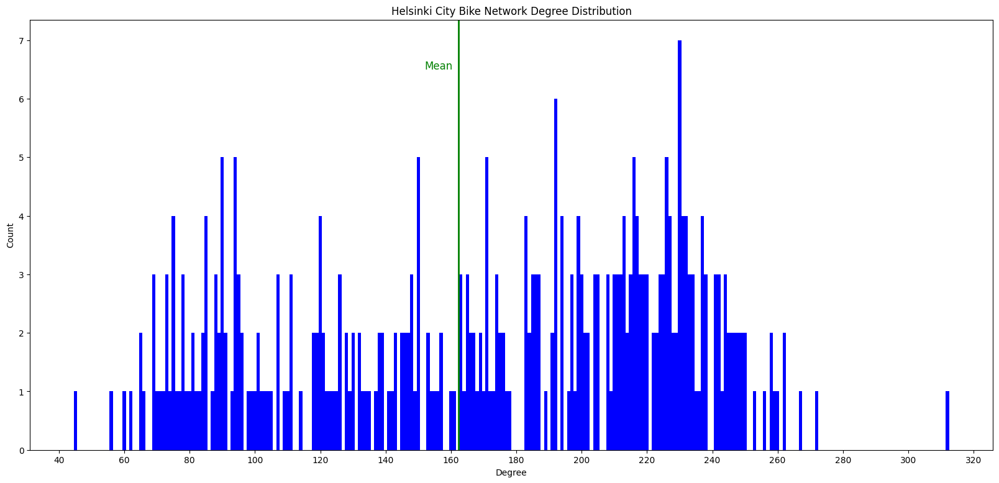

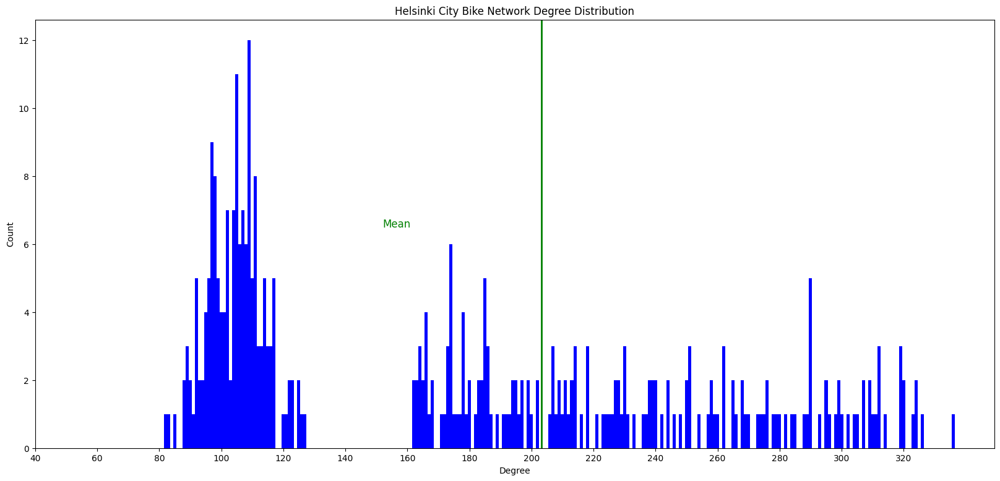

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt
import collections

def centralityDegreeDist(G):
    """
    Centrality degree distribution
    """
    # Degree
    degree_sequence = sorted([d for n, d in G.degree()], reverse=True)
    degreeCount = collections.Counter(degree_sequence)
    deg, cnt = zip(*degreeCount.items())

    # Figure
    fig, ax = plt.subplots(figsize=(20,9))
    plt.bar(deg, cnt, width=1, color="blue")
    plt.axvline(x=sum(deg)/len(deg), color="green", linestyle='-', linewidth=2) # Degree Mean

    # Labeling
    plt.title("Helsinki City Bike Network Degree Distribution")
    plt.ylabel("Count")
    plt.xlabel("Degree")
    plt.text(x=152, y=6.5, s="Mean", color="green", fontsize=12)
    ax.set_xticks(range(40, 340, 20))

    plt.show()

# Compare degree distributions
barabasi_model = nx.barabasi_albert_graph(len(G.nodes()), 162)  # Create a Barabasi-Albert model with similar number of nodes and average degree

centralityDegreeDist(G)  # Plot degree distribution of your current network
centralityDegreeDist(barabasi_model)  # Plot degree distribution of the Barabasi-Albert model


The average degree of a node in the Helsinki city bike network is 162. This means that a bike station on average is connected to 162 different stations. The stations with the highest centrality degree are:

- Haukilahdenkatu:    312 connections

- Paciuksenkaari:     272 connections

- Huopalahdentie:     267 connections

- Laajalahden aukio:  262 connections

- Munkkiniemen aukio: 262 connections

The fact that Haukilahdenkatu station is at the top of this list suggests that a large number of citizens from different districts make regular trips to and from this station. This could potentially mean that this station is either next to a large transportation hub or an important point of interest. Quick google search will reveal that it's located across the street from a large educational institution and a work rehabilitation centre. This explains both the regularity of the trips and the inflow of people from different suburban areas.

The comparison with Albert-Barabasi model indicates similar network structure both resulting in a barcode-like distribution. The barcode shape in both distributions suggests the presence of degree heterogeneity in the networks. In other words, there are nodes with significantly different numbers of connections, creating distinct "bars" in the distribution. This can indicate the presence of hubs (nodes with high degrees) and a diverse range of connectivity patterns in the network. Departure from Power-Law Distribution: The barcode shape of the distributions suggests that the degree distribution may deviate from a traditional power-law distribution. While power-law distributions typically exhibit a smooth, gradually decreasing pattern, a barcode-like distribution indicates a more discrete and uneven distribution of node degrees.

## 4.2 Betweenness Centrality

The betweenness centrality captures how much a given node is "in-between" others. This measure calculates the shortest paths between all the nodes of the network and assigns each node a measure based on the number of shortest paths going through the target node. The graph below illustrates the city bike stations by betweenness centrality.

<ipython-input-21-f55e91ddbf3d>:26: MatplotlibDeprecationWarning:

Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.



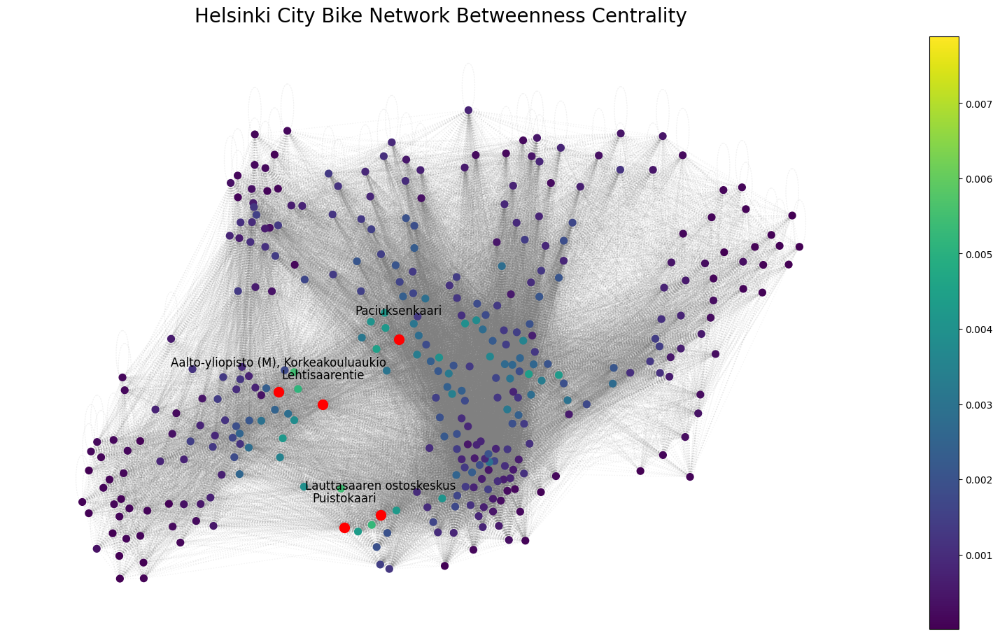

In [ ]:
def centralityBetweenness(Graph):
    """
    This function plots the city bike network betweenness centrality
    """

    G = Graph.copy(as_view=False)
    G.remove_node("Haukilahdenkatu")

    # Figure
    fig, ax = plt.subplots(figsize=(20,11))

    betweenness = nx.betweenness_centrality(G)

    # Get the top 5 nodes with highest betweenness centrality
    top_nodes = sorted(betweenness, key=betweenness.get, reverse=True)[:5]

    node_color = [betweenness[i] for i in betweenness.keys()]

    # Color scale
    colors = range(20)
    cmap = plt.cm.viridis
    vmin = min(node_color)
    vmax = max(node_color) - (sum(node_color) / len(node_color))
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=vmin, vmax=vmax))
    sm._A = []
    plt.colorbar(sm)

    # Draw
    nx.draw_networkx_nodes(G=G, pos=G.nodes.data('pos'), node_color=node_color, cmap="viridis", alpha=1, node_size=50)
    nx.draw_networkx_edges(G=G, pos=G.nodes.data('pos'), edge_color='grey', style="dotted", alpha=0.1, arrows=False)

    # Labeling Axes
    ax.set_title('Helsinki City Bike Network Betweenness Centrality', fontdict={"fontsize":20}, pad=15)
    ax.axis('off')

    # Highlight top nodes and show their names
    for node in top_nodes:
        nx.draw_networkx_nodes(G=G, pos=G.nodes.data('pos'), nodelist=[node], node_color='red', alpha=1, node_size=100)
        x, y = G.nodes.data('pos')[node]
        plt.text(x, y + 0.005, node, fontsize=12, ha='center', color='black')

    plt.show()

centralityBetweenness(G)


The node with the highest betweenness centrality represents the Lehtisaarentie station. This is a well-saturated example of geographic constraints affecting the structure of spatial networks. The station is located on the Lehtisaari island that links the Aalto University campus to Munkkiniemi and Helsinki. Due to the specificity of the Helsinki archipelago, traffic flows from one municipality to another are mostly channelled through island-bridge systems that lie in between. This makes both Lehtisaari and Lautasarri islands crucial traffic nodes connecting the municipality of Espoo to Helsinki.

## 4.3 Closeness Centrality
Closeness centrality is a way of detecting nodes that are able to distribute flows efficiently through the network. It measures how close a node is to all other nodes in terms of the shortest path length. The shortest path length between two nodes is the minimum number of edges that need to be traversed to reach from one node to another. Within the context of the city bikes, a node with high closeness centrality will indicate stations that can potentially act as versatile intermediary stations within the network.

<ipython-input-22-497058565085>:22: MatplotlibDeprecationWarning:

Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.



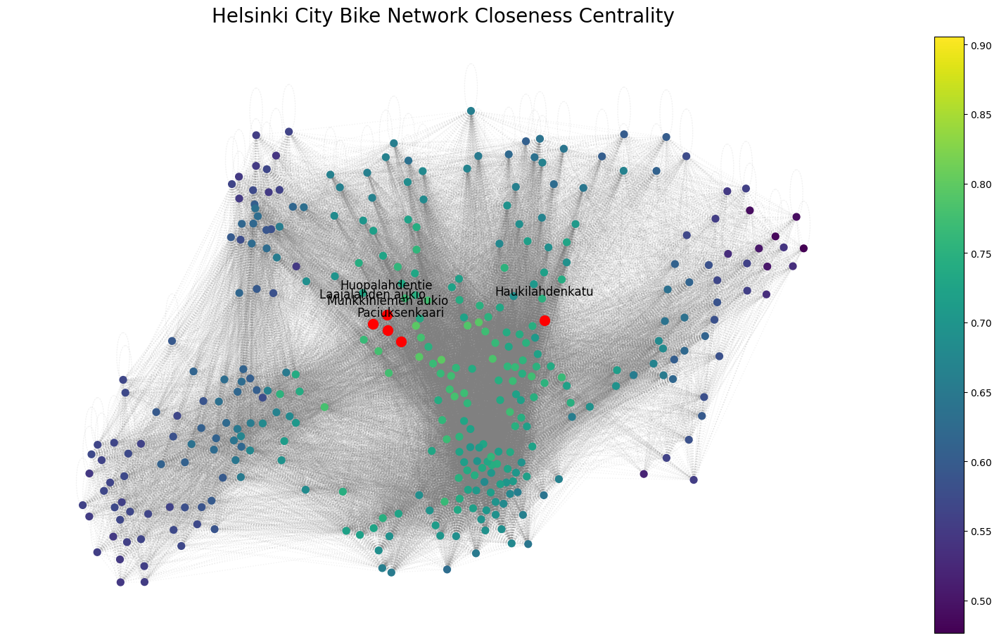

In [ ]:
def centralityCloseness(G):
    """
    This function plots the city bike network closeness centrality
    """
    # Figure
    fig, ax = plt.subplots(figsize=(20, 11))

    closeness = nx.closeness_centrality(G)

    # Get the top 5 nodes with highest closeness centrality
    top_nodes = sorted(closeness, key=closeness.get, reverse=True)[:5]

    node_color = [closeness[i] for i in closeness.keys()]

    # Color scale
    colors = range(20)
    cmap = plt.cm.viridis
    vmin = min(node_color)
    vmax = max(node_color)
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=vmin, vmax=vmax))
    sm._A = []
    plt.colorbar(sm)

    # Draw
    nx.draw_networkx_nodes(G=G, pos=G.nodes.data('pos'), node_color=node_color, cmap="viridis", alpha=1, node_size=50)
    nx.draw_networkx_edges(G=G, pos=G.nodes.data('pos'), edge_color='grey', style="dotted", alpha=0.1, arrows=False)

    # Labeling Axes
    ax.set_title('Helsinki City Bike Network Closeness Centrality', fontdict={"fontsize": 20}, pad=15)
    ax.axis('off')

    # Highlight top nodes and show their names
    for node in top_nodes:
        nx.draw_networkx_nodes(G=G, pos=G.nodes.data('pos'), nodelist=[node], node_color='red', alpha=1, node_size=100)
        x, y = G.nodes.data('pos')[node]
        plt.text(x, y + 0.005, node, fontsize=12, ha='center', color='black')

    plt.show()

centralityCloseness(G)


As illustrated before a large amount of stations is directly connected to Haukilahdenkatu station. This leads to Haukilahdenkatu station having the highest closeness centrality within the network. Other nodes with high closeness centrality are located in the areas of Töölo and Pasila. Closeness centrality might be interesting metrics for network optimization, especially for larger networks. In larger bike-sharing networks users might be motivated to make stops at the intermediary bike stations to avoid extra charges.

## 4.4 Eigenvector centrality & PageRank
Eigenvector centrality measures a node's importance within the network while giving consideration to the importance of its neighbours. Connections to high-scoring eigenvector centrality nodes contribute more to the score than equal connections to low-scoring nodes. In other words, a node with a large number of connections may have a low Eigenvector score if all of its connections are with low-score nodes. A popular variation of eigenvector centrality is Google's PageRank. In essence, PageRank is a variation of normalized eigenvector centrality combined with random jumps. Thus it is not surprising that Pagerank yields result comparable to Eigenvector(graphs below). With this method, stations like the Central Railway Station, Pasila, Lehtisaarentie and Haukilahdenkatu appear as central nodes within the network.

<ipython-input-23-a8e06afc4f7f>:22: MatplotlibDeprecationWarning:

Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.



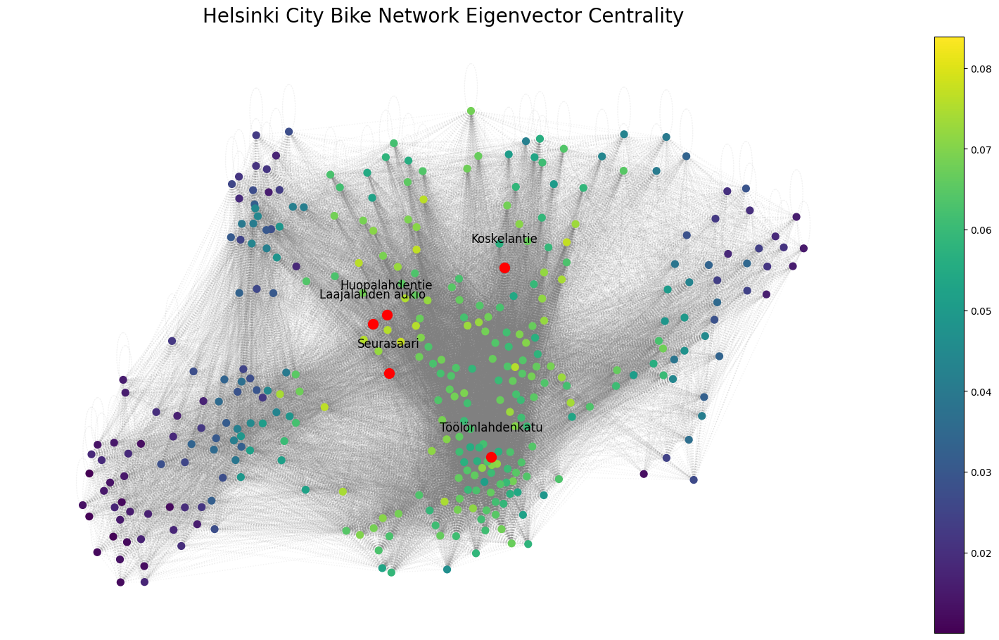

In [ ]:
def centralityEigenvector(G):
    """
    This function plots the city bike network Eigenvector centrality
    """
    # Figure
    fig, ax = plt.subplots(figsize=(20, 11))

    eigenvector = nx.eigenvector_centrality(G, max_iter=6000, weight="duration")

    # Get the top 5 nodes with highest eigenvector centrality
    top_nodes = sorted(eigenvector, key=eigenvector.get, reverse=True)[:5]

    node_color = [eigenvector[i] for i in eigenvector.keys()]

    # Color scale
    colors = range(20)
    cmap = plt.cm.viridis
    vmin = min(node_color)
    vmax = max(node_color)
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=vmin, vmax=vmax))
    sm._A = []
    plt.colorbar(sm)

    # Draw
    nx.draw_networkx_nodes(G=G, pos=G.nodes.data('pos'), node_color=node_color, cmap="viridis", alpha=1, node_size=50)
    nx.draw_networkx_edges(G=G, pos=G.nodes.data('pos'), edge_color='grey', style="dotted", alpha=0.1, arrows=False)

    # Labeling Axes
    ax.set_title('Helsinki City Bike Network Eigenvector Centrality', fontdict={"fontsize": 20}, pad=15)
    ax.axis('off')

    # Highlight top nodes and show their names
    for node in top_nodes:
        nx.draw_networkx_nodes(G=G, pos=G.nodes.data('pos'), nodelist=[node], node_color='red', alpha=1, node_size=100)
        x, y = G.nodes.data('pos')[node]
        plt.text(x, y + 0.005, node, fontsize=12, ha='center', color='black')

    plt.show()

centralityEigenvector(G)


<ipython-input-24-851c2039ea50>:45: MatplotlibDeprecationWarning:

Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.



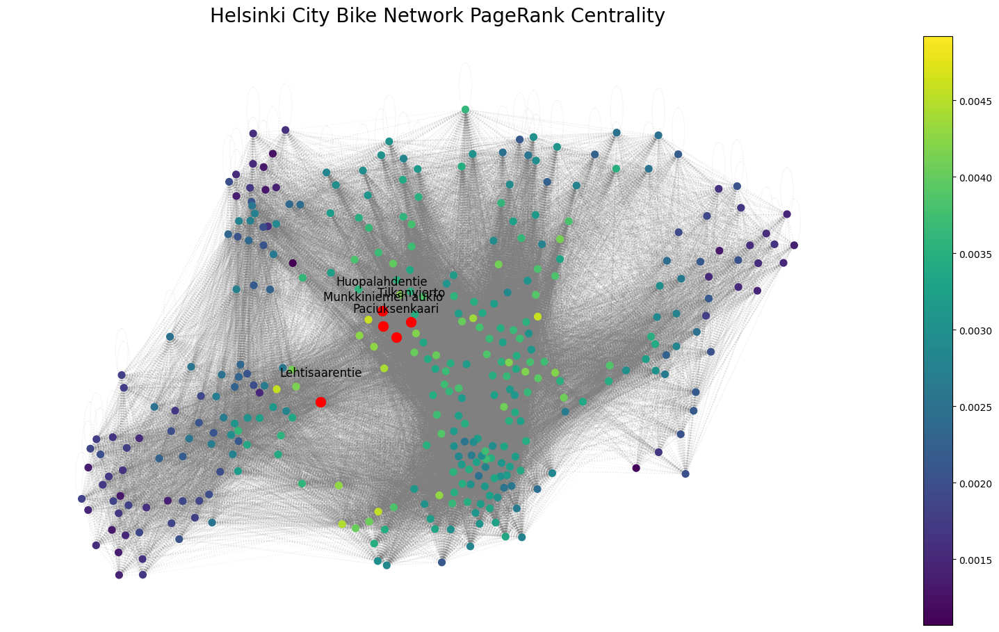

In [ ]:
def centralityPageRank(dataframe, year=2020):
    """
    This function plots the city bike network nodes by PageRank
    """

    df = dataframe.copy()
    df = df[df['departure'].dt.year == year]
    df.dropna(inplace=True)

    # Directed Graph
    G = nx.Graph()
    G = nx.from_pandas_edgelist(df, source='departure_name', target='return_name', edge_attr=['duration','distance'], create_using=nx.DiGraph())

    # Positions
    stantions = pd.read_csv("/content/drive/MyDrive/Analiza_Mreza/station_coordinates.csv")
    stantions.set_index('name', inplace=True)
    stantions["pos"] = list(zip(stantions["longitude"].astype(float), stantions["latitude"].astype(float)))
    pos = stantions.to_dict()['pos']

    # Map "pos" attribute to nodes from pos dict
    for node, position in pos.items():
        try:
            G.nodes[node]['pos'] = position
        except KeyError:
            pass

    # PageRank
    pagerank = nx.pagerank(G, weight="duration")

    # Get the top 5 nodes with highest PageRank centrality
    top_nodes = sorted(pagerank, key=pagerank.get, reverse=True)[:5]

    node_color = [pagerank[i] for i in pagerank.keys()]

    # Figure
    fig, ax = plt.subplots(figsize=(20, 11))

    # Color Scale
    colors = range(20)
    cmap = plt.cm.viridis
    vmin = min(node_color)
    vmax = max(node_color)
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=vmin, vmax=vmax))
    sm._A = []
    plt.colorbar(sm)

    # Draw
    nx.draw_networkx_nodes(G=G, pos=G.nodes.data('pos'), node_color=node_color, cmap="viridis", alpha=1, node_size=50)
    nx.draw_networkx_edges(G=G, pos=G.nodes.data('pos'), edge_color='grey', style="dotted", alpha=0.1, arrows=False)

    # Labeling Axes
    ax.set_title('Helsinki City Bike Network PageRank Centrality', fontdict={"fontsize": 20}, pad=15)
    ax.axis('off')

    # Highlight top nodes and show their names
    for node in top_nodes:
        nx.draw_networkx_nodes(G=G, pos=G.nodes.data('pos'), nodelist=[node], node_color='red', alpha=1, node_size=100)
        x, y = G.nodes.data('pos')[node]
        plt.text(x, y + 0.005, node, fontsize=12, ha='center', color='black')

    plt.show()

centralityPageRank(dataframe)


The application of eigenvector and PageRank in urban contexts is a debated topic. These metrics may yield misleading results as they overlook various urban qualities contributing to a node's importance. Some proposed solutions involve augmenting graphs with more information, but this approach introduces arbitrary patterns and blurs the clarity achieved through abstraction, creating an anti-pattern.

While Eigenvector centrality may have limitations in capturing urban qualities in collective transportation systems with predetermined routes, this is not the case in individual transportation. Individual transportation networks are shaped by users, embedding urban qualities within them. User choices create a trivial voting mechanism that rates different areas of the city, making the study of network structure a study of user behavior and preferences. Eigenvector centrality in individual transportation networks not only highlights important nodes but also geographically significant areas. It recognizes that the importance of city bike stations (nodes) derives from their relationships with neighboring nodes rather than their inherent attributes. These central stations and adjacent nodes form active enclaves, which can be identified through community detection in complex networks.

# **5. Community Detection**
Communities in networks refer to groups of nodes that are densely connected internally. Community detection is often a crucial process for understanding the structure of complex networks. In the case of the city bike network, community detection can help to better understand bike usage patterns and determine adequate pricing models. There is a number of algorithms available for community detection.

## Louvain Method
The Louvain community detection algorithm is selected for its elegant simplicity and ease of implementation and computation. By applying the Louvain method to analyze the Helsinki city bike network, the results reveal the presence of three distinct communities or clusters within the network. This finding implies that the bike network can be naturally divided into three cohesive subsets or groups, where nodes within each subset exhibit a higher density of connections among themselves compared to connections with nodes outside their respective communities. Identifying these distinct communities provides crucial insights for further analysis and decision-making related to urban transportation planning, resource allocation, and potential optimizations within each community or cluster. This information can aid in enhancing the efficiency, connectivity, and overall functionality of the city's bike infrastructure.






<ipython-input-25-e2ea874bdfe2>:18: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



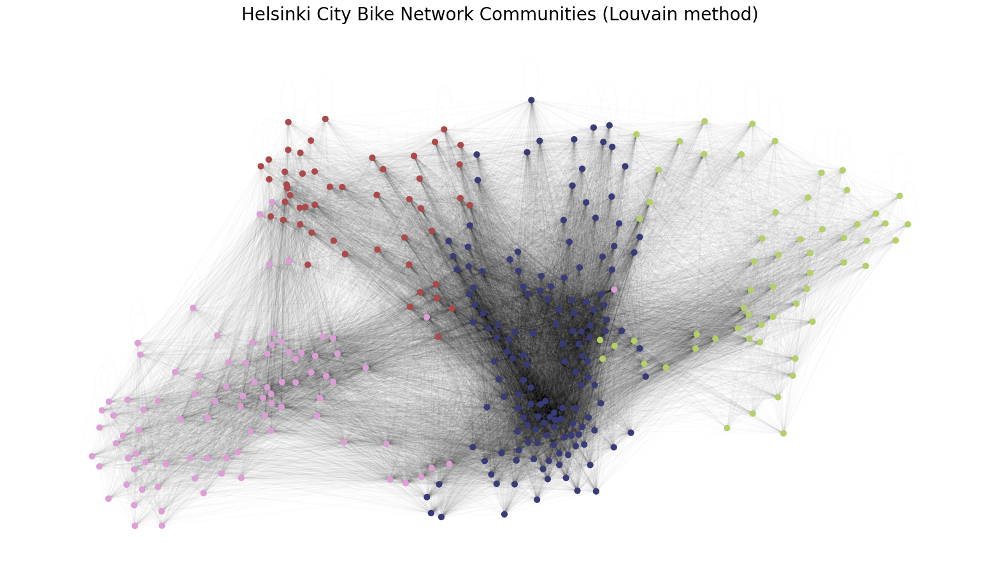

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from community import community_louvain

def communityLouvain(G):
    """
    This function applies the Louvain method for community detection on the City bike network.
    """

    # Figure
    fig, ax = plt.subplots(figsize=(20,11))

    # Compute Louvain method
    partition = community_louvain.best_partition(G, random_state=2)

    # Partition colormap
    cmap = cm.get_cmap('tab20b', max(partition.values()) + 1)

    # Draw Nodes & Edges
    nx.draw_networkx_nodes(G, G.nodes.data('pos'), partition.keys(), node_size=40, cmap=cmap, node_color=list(partition.values()))
    nx.draw_networkx_edges(G, G.nodes.data('pos'), alpha=0.015)

    # Labeling Axes
    ax.set_title('Helsinki City Bike Network Communities (Louvain method)', fontdict={"fontsize":20}, pad=15)
    ax.axis('off')

    plt.show()

communityLouvain(G)


This means that bike usage inside these four communities is higher than the bike usage between these communities. Nodes with high betweenness centrality are usually the places where the communities might be divided into modules. If we return to our betweenness centrality graph this relationship will become even more evident. Boundaries of the communities pass roughly through the nodes with high betweenness centrality. Also, this division doesn't come as a surprise taking into account the geographic character of the Helsinki archipelago. Landmasses and their divisions by large bodies of water significantly affect community formation. It is important to highlight that all transportation networks are spatial networks and their structure and evolution are closely intertwined with physical constraints. An interesting discovery is that the Leppavara area, despite being part of Espoo municipality, is more densely connected to Munkiniemi and Pitäjänmaki than to Otniemi or Tapiola areas. A similar tendency can be seen in some stations around Sörnäinen where stations are more densely connected to the Herttoniemi area.

**Hypothesis 4: There are communities or clusters of bike stations within the network.** \\
**HA:** The analysis reveals distinct groups of bike stations that exhibit higher connectivity and proximity to each other compared to the overall network.

# **Conclusion**
Hypothesis: \\
1. **HA:** There is a significant relationship between the duration, traveled distance, and the number of riders in the bike network.
2. **HA:** There are variations in the popularity of bike stations in the network.
3. **HA:** Air temperature has an impact on travel patterns. The findings indicate a higher frequency of trips during more favorable weather conditions.
4. **HA:** The analysis reveals distinct groups of bike stations that exhibit higher connectivity and proximity to each other compared to the overall network.

The goal of every transportation system is to be effective as possible and this analysis of the bike network has provided valuable insights regarding various factors that can contribute to its efficiency. \\
Firstly, findings support the hypothesis that there is a significant relationship between the duration, traveled distance, and the number of riders in the bike network. This suggests that the distance between bike stations and the time it takes to complete a trip play important roles in determining the popularity and usage of the network. \\
Secondly, variations in the popularity of bike stations within the network indicate that certain stations attract more ridership than others. This highlights the importance of considering the demand and usage patterns of specific stations when optimizing the bike network infrastructure. \\
Moreover, this analysis confirms that air temperature has an impact on travel patterns, with a higher frequency of trips observed during more favorable weather conditions. \\
Lastly, the identification of distinct groups or communities of bike stations within the network signifies the presence of local clusters that exhibit higher connectivity and proximity to each other compared to the overall network. This knowledge can be used to enhance network efficiency by strategically locating stations and optimizing the allocation of resources within these communities.
